<a href="https://colab.research.google.com/github/siddhm11/among-us/blob/main/amongus_yolov8_final_backup.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install yt-dlp


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 170.1/170.1 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 67.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.3/157.3 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 74.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 60.8 MB/s eta 0:00:00


In [2]:
import os

video_url = 'https://www.youtube.com/watch?v=psiV8oFiESE'

# Download the video using yt-dlp
os.system(f'yt-dlp -f best {video_url} -o /content/video2.mp4')

# Verify the video is downloaded
!ls /content/video.mp4


ls: cannot access '/content/video.mp4': No such file or directory


In [3]:
!pip install opencv-python


In [4]:
import cv2
import os

# Path to the downloaded video
video_path = '/content/video2.mp4'

# Create a directory to save the frames
frames_dir = '/content/video2_frames'
os.makedirs(frames_dir, exist_ok=True)

# Open the video file
video_capture = cv2.VideoCapture(video_path)

# Initialize frame count
frame_count = 0
saved_frame_count = 0

# Loop through the video and save every 100th frame
while True:
    success, frame = video_capture.read()
    if not success:
        break

    # Save every 100th frame
    if frame_count % 100 == 0:
        frame_filename = os.path.join(frames_dir, f'frame_{saved_frame_count:05d}.jpg')
        cv2.imwrite(frame_filename, frame)
        saved_frame_count += 1

    frame_count += 1

# Release the video capture object||
video_capture.release()

print(f"Extracted {saved_frame_count} frames (every 100th frame) to {frames_dir}")


Extracted 251 frames (every 100th frame) to /content/video2_frames


In [5]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 872.0/872.0 kB 46.2 MB/s eta 0:00:00


In [6]:
from ultralytics import YOLO
model = YOLO("yolov8m.pt")

100%|██████████| 49.7M/49.7M [00:00<00:00, 457MB/s]


In [10]:
!scp '/content/among us video1.v3i.yolov8 (2).zip' '/content/alldata1.zip'

!unzip '/content/alldata1.zip' -d '/content/amongusdata1'

Archive:  /content/alldata1.zip
replace /content/amongusdata1/README.dataset.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
  inflating: /content/amongusdata1/README.roboflow.txt  
  inflating: /content/amongusdata1/data.yaml  
   creating: /content/amongusdata1/test/
   creating: /content/amongusdata1/test/images/
 extracting: /content/amongusdata1/test/images/frame_00011_jpg.rf.421a5b8bd13a7bf12b1ac4e775834bac.jpg  
 extracting: /content/amongusdata1/test/images/frame_00012_jpg.rf.6d467519dc3887b892d75386339368cf.jpg  
 extracting: /content/amongusdata1/test/images/frame_00025_jpg.rf.e76746c6bd7c3acd9374cd2aea6f7d7f.jpg  
 extracting: /content/amongusdata1/test/images/frame_00027_jpg.rf.1e1d91f7079a700b9a967070472f9f4a.jpg  
 extracting: /content/amongusdata1/test/images/frame_00028_jpg.rf.4b80cfb17713db4999c9737ebb62a144.jpg  
 extracting: /content/amongusdata1/test/images/frame_00068_jpg.rf.6abf37332e7d53d712aa9418a374aacf.jpg  
 extracting: /content/amongusdata1/test/images/frame_00

In [11]:
from ultralytics import YOLO

# Load the larger YOLOv8 model
model = YOLO("yolov8m.pt")

# Train the model with optimized parameters
model.train(
    data="/content/amongusdata1/data.yaml",  # Path to the dataset YAML file
    epochs=75,                   # Number of epochs
    imgsz=704,                   # Increased image size
    batch=8,                     # Batch size
    lr0=1e-3,                    # Initial learning rate
    lrf=0.005,                   # Final learning rate using a scheduler
    augment=True,                # Enable data augmentation
    patience=5,                  # Early stopping patience
    save_period=1,               # Save model at every epoch
)


Ultralytics YOLOv8.2.86 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/amongusdata1/data.yaml, epochs=75, time=None, patience=5, batch=8, imgsz=704, save=True, save_period=1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_

100%|██████████| 755k/755k [00:00<00:00, 132MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 6.25M/6.25M [00:00<00:00, 375MB/s]


AMP: checks passed ✅


/usr/local/lib/python3.10/dist-packages/ultralytics/engine/trainer.py:268: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(enabled=self.amp)
train: Scanning /content/amongusdata1/train/labels... 174 images, 14 backgrounds, 0 corrupt: 100%|██████████| 174/174 [00:00<00:00, 1784.50it/s]

train: New cache created: /content/amongusdata1/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 9, len(boxes) = 953. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/amongusdata1/valid/labels... 49 images, 4 backgrounds, 0 corrupt: 100%|██████████| 49/49 [00:00<00:00, 706.78it/s]

val: New cache created: /content/amongusdata1/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 704 train, 704 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 75 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/75      4.45G      1.345      2.053      1.268         53        704: 100%|██████████| 22/22 [00:10<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.54it/s]

                   all         49        237      0.543      0.402      0.306      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/75      4.31G      1.154      1.095      1.193         38        704: 100%|██████████| 22/22 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.54it/s]

                   all         49        237      0.473      0.661      0.552      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/75      4.35G      1.146     0.9617      1.254         22        704: 100%|██████████| 22/22 [00:07<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.52it/s]

                   all         49        237      0.279      0.766      0.307      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/75      4.38G      1.162     0.9678      1.282         72        704: 100%|██████████| 22/22 [00:06<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.84it/s]

                   all         49        237      0.648      0.764      0.665      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/75      4.31G      1.128     0.8431      1.229         63        704: 100%|██████████| 22/22 [00:07<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.83it/s]

                   all         49        237      0.788      0.767      0.727      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/75       4.3G      1.189     0.8362      1.263         49        704: 100%|██████████| 22/22 [00:07<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.87it/s]

                   all         49        237      0.771        0.9      0.766      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/75      4.31G      1.092     0.7577      1.242         23        704: 100%|██████████| 22/22 [00:06<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.81it/s]

                   all         49        237      0.575      0.657      0.563      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/75      4.35G      1.157     0.8359      1.303         44        704: 100%|██████████| 22/22 [00:07<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.84it/s]

                   all         49        237      0.495       0.82      0.684      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/75      4.35G      1.007     0.7005      1.197         49        704: 100%|██████████| 22/22 [00:08<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.85it/s]

                   all         49        237      0.717        0.8       0.79      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/75      4.35G     0.9576     0.6387      1.176         40        704: 100%|██████████| 22/22 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.70it/s]

                   all         49        237      0.509      0.654      0.555      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/75      4.36G      1.084     0.7317      1.243         71        704: 100%|██████████| 22/22 [00:07<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.82it/s]

                   all         49        237      0.773      0.745      0.748      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/75      4.38G      1.083     0.7233      1.239         58        704: 100%|██████████| 22/22 [00:08<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.76it/s]

                   all         49        237      0.715      0.696      0.642      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/75      4.38G      1.023     0.6969      1.215         38        704: 100%|██████████| 22/22 [00:06<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.09it/s]

                   all         49        237      0.757      0.802      0.783      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/75      4.37G     0.9631     0.6316      1.151         63        704: 100%|██████████| 22/22 [00:07<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.69it/s]

                   all         49        237      0.673      0.618       0.59      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/75      4.38G     0.9411     0.6629       1.18         47        704: 100%|██████████| 22/22 [00:07<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.47it/s]

                   all         49        237       0.67      0.637      0.642      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/75      4.35G     0.9866     0.6857        1.2         36        704: 100%|██████████| 22/22 [00:06<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.64it/s]

                   all         49        237      0.718      0.891      0.752      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/75      4.38G      0.944     0.5939      1.127         50        704: 100%|██████████| 22/22 [00:07<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.77it/s]

                   all         49        237      0.665      0.853      0.735      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/75      4.33G     0.9871     0.6558        1.2         47        704: 100%|██████████| 22/22 [00:07<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.79it/s]

                   all         49        237      0.752      0.852      0.713      0.459
EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 13, best model saved as best.pt.
To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



18 epochs completed in 0.060 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.86 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.65s/it]


                   all         49        237      0.789      0.663      0.729      0.459
   among us characters         42        209      0.637      0.737       0.72      0.526
             dead body         11         13      0.539      0.923      0.644      0.479
          meeting call          5          5      0.982        0.4      0.703      0.498
                  vent         10         10          1      0.591      0.848      0.331
Speed: 0.3ms preprocess, 56.5ms inference, 0.0ms loss, 6.1ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79159ecc1180>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [13]:
# Save the trained model
model_path = "/content/amongusdata1/yolov8_model.pt"
model.save(model_path)
print(f"Model saved to {model_path}")



Model saved to /content/amongusdata1/yolov8_model.pt


In [14]:
from ultralytics import YOLO

# Load the model from the best checkpoint
model = YOLO("/content/amongusdata1/yolov8_model.pt")

In [15]:
# Path to your sample image
image_path = "/content/oakImage-1602686170971-superJumbo (1).jpg"

# Run inference on the image
results = model.predict(source=image_path, save=True, save_txt=True)


image 1/1 /content/oakImage-1602686170971-superJumbo (1).jpg: 384x640 10 among us characterss, 1 vent, 45.3ms
Speed: 3.4ms preprocess, 45.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict
1 label saved to runs/detect/predict/labels



0: 384x640 10 among us characterss, 1 vent, 26.3ms
Speed: 2.4ms preprocess, 26.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


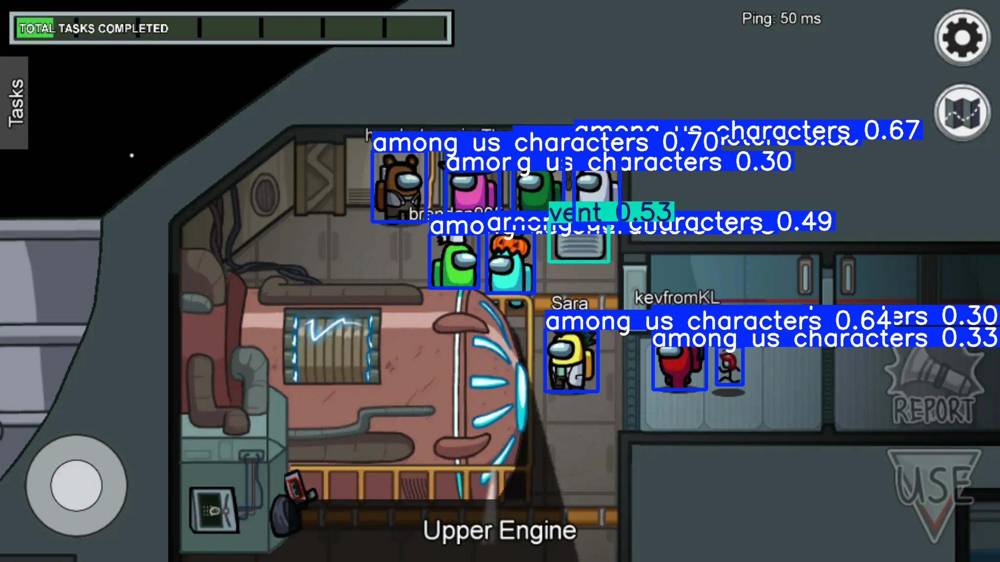

In [27]:
from ultralytics import YOLO
import cv2
from matplotlib import pyplot as plt

# Define the confidence threshold
confidence_threshold = 0.27

# Load the model
model = YOLO("/content/amongusdata1/yolov8_model.pt")


# Load the image
img = cv2.imread(image_path)

# Perform inference
results = model(img)

# Plot the image with the predicted bounding boxes
result = results[0]


# Filter out detections below the confidence threshold
filtered_boxes = []
for box in result.boxes:
    if box.conf >= confidence_threshold:
        filtered_boxes.append(box)

# Update the result with the filtered boxes
result.boxes = filtered_boxes

# Plot the image with the filtered bounding boxes
result.plot()

# Save the image with the results
result.save("/content/ans.png")

# Display the image
display(Image("/content/ans.png"))



In [17]:
import subprocess
from ultralytics import YOLO

# Step 1: Download the video snippet using yt-dlp
video_url = "https://www.youtube.com/watch?v=ScyCpjA6CQs"
output_file = "input_video.mp4"

# Specify start time (-ss) as 60 seconds and end time (-to) as 120 seconds
command = [
    "yt-dlp", video_url,
    "--downloader", "ffmpeg",
    "--downloader-args", "ffmpeg_i:-ss 220 -to 250",
    "-o", output_file
]

result = subprocess.run(command, stdout=subprocess.PIPE, stderr=subprocess.PIPE)

if result.returncode == 0:
    print(f"Video snippet downloaded successfully as {output_file}")
else:
    print("An error occurred:", result.stderr.decode())


Video snippet downloaded successfully as input_video.mp4


In [18]:
import cv2
import os

# Directory to save extracted frames
frames_dir = "/content/frames2/"
os.makedirs(frames_dir, exist_ok=True)

video_path = "/content/input_video.mp4.mkv"
# Open the video file
video = cv2.VideoCapture(video_path)
fps = video.get(cv2.CAP_PROP_FPS)  # Get the frame rate of the video
frame_interval = int(fps)  # Extract one frame per second (fps = frames per second)

frame_number = 0
while True:
    success, frame = video.read()
    if not success:
        break

    # Save frames every second
    if frame_number % frame_interval == 0:
        frame_filename = os.path.join(frames_dir, f"frame_{frame_number // frame_interval}.jpg")
        cv2.imwrite(frame_filename, frame)

    frame_number += 1

video.release()



image 1/1 /content/frames2/frame_11.jpg: 384x640 (no detections), 26.9ms
Speed: 4.2ms preprocess, 26.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


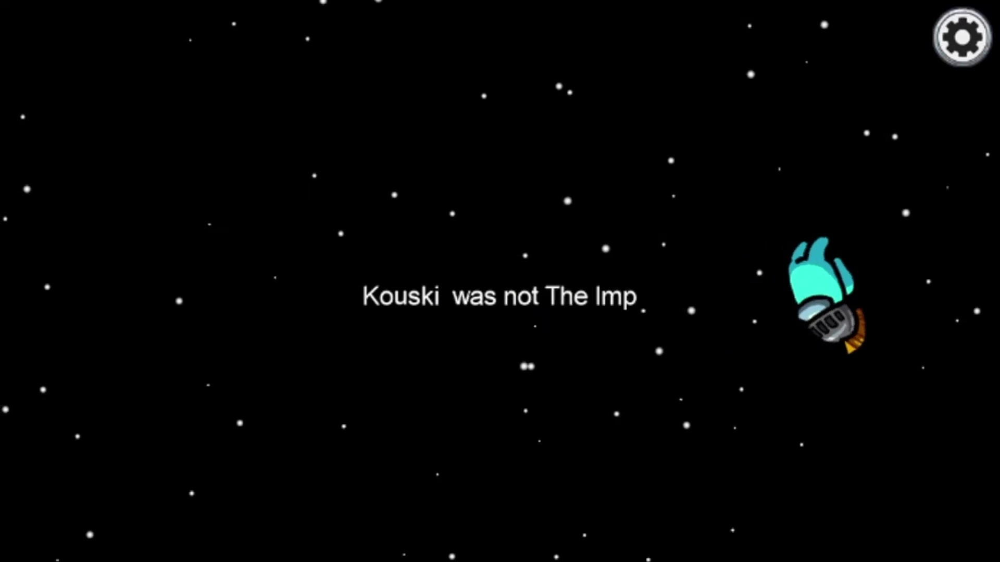

Processed frame saved to /content/runs/predict2/frame_11.jpg

image 1/1 /content/frames2/frame_8.jpg: 384x640 (no detections), 24.6ms
Speed: 3.2ms preprocess, 24.6ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


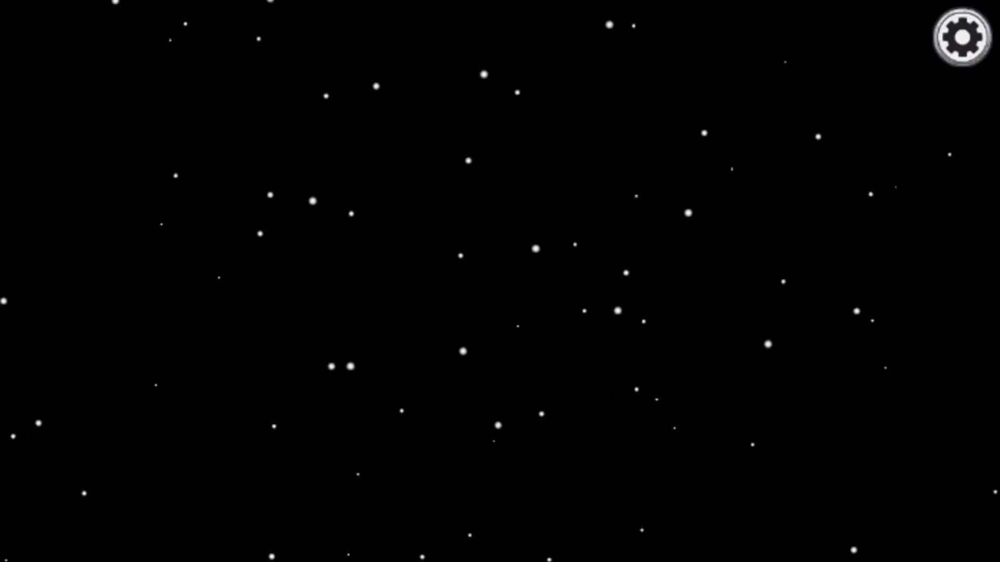

Processed frame saved to /content/runs/predict2/frame_8.jpg

image 1/1 /content/frames2/frame_15.jpg: 384x640 5 among us characterss, 24.6ms
Speed: 3.9ms preprocess, 24.6ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


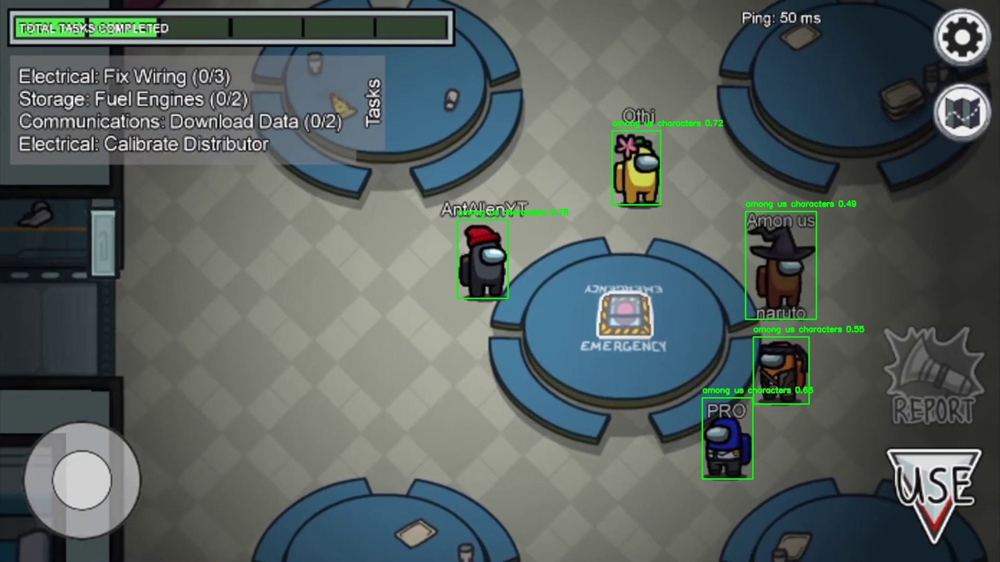

Processed frame saved to /content/runs/predict2/frame_15.jpg

image 1/1 /content/frames2/frame_29.jpg: 384x640 (no detections), 26.3ms
Speed: 6.3ms preprocess, 26.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


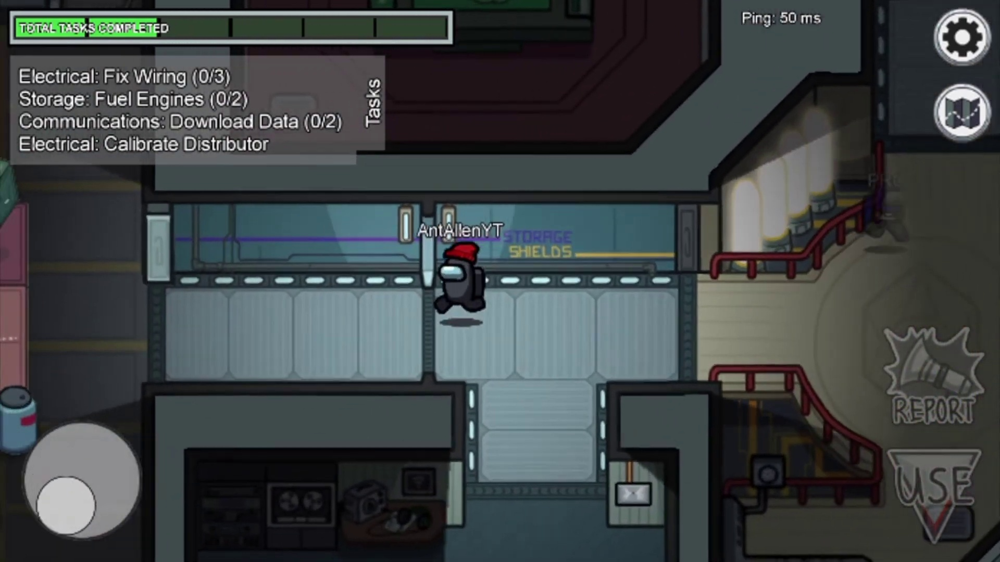

Processed frame saved to /content/runs/predict2/frame_29.jpg

image 1/1 /content/frames2/frame_12.jpg: 384x640 (no detections), 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


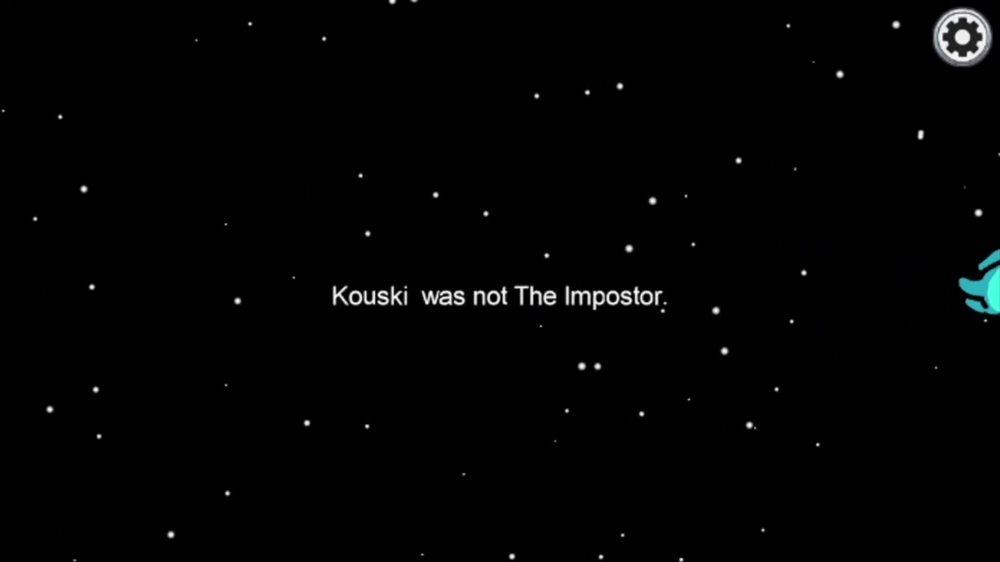

Processed frame saved to /content/runs/predict2/frame_12.jpg

image 1/1 /content/frames2/frame_1.jpg: 384x640 8 among us characterss, 4 dead bodys, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


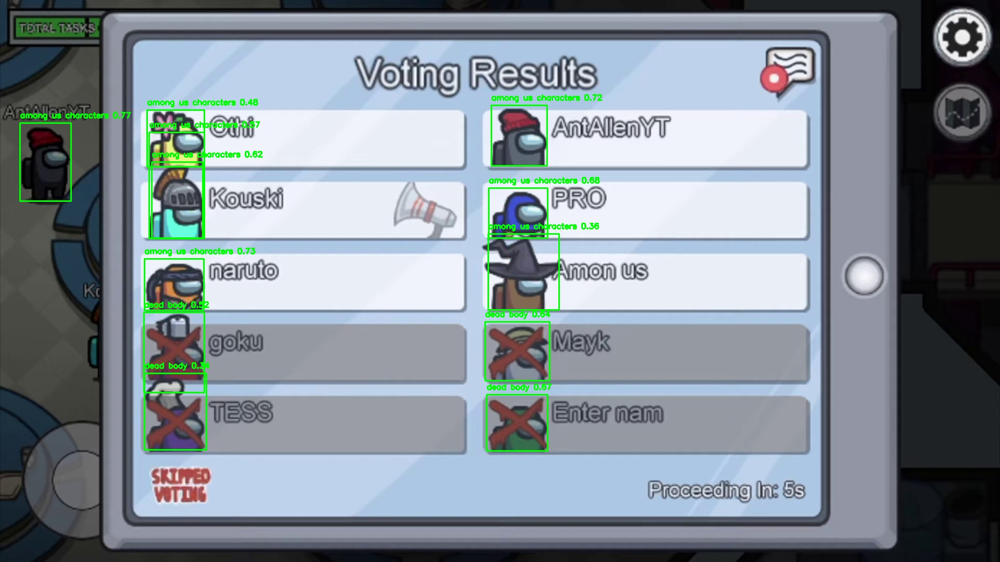

Processed frame saved to /content/runs/predict2/frame_1.jpg

image 1/1 /content/frames2/frame_27.jpg: 384x640 1 among us characters, 25.3ms
Speed: 5.1ms preprocess, 25.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


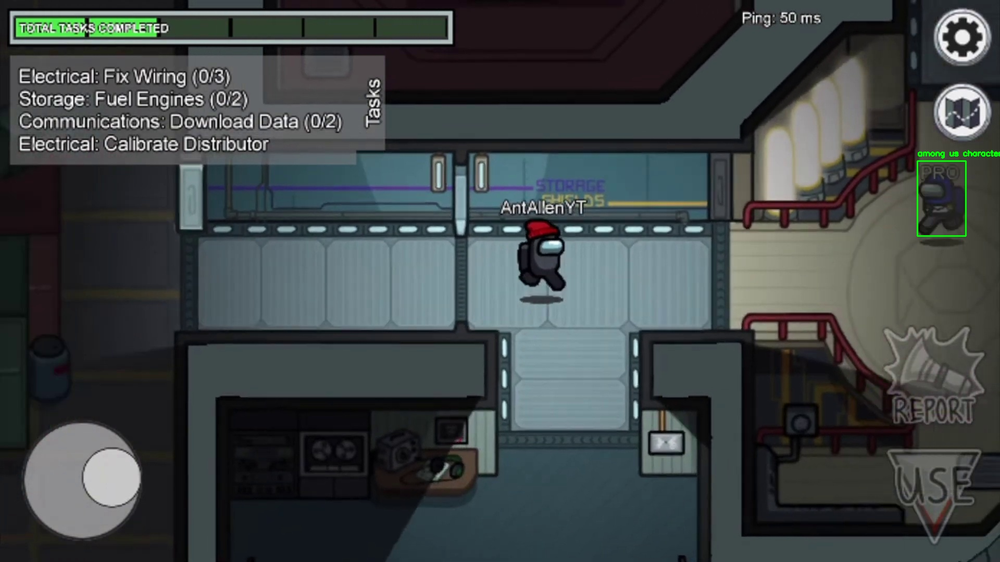

Processed frame saved to /content/runs/predict2/frame_27.jpg

image 1/1 /content/frames2/frame_14.jpg: 384x640 (no detections), 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


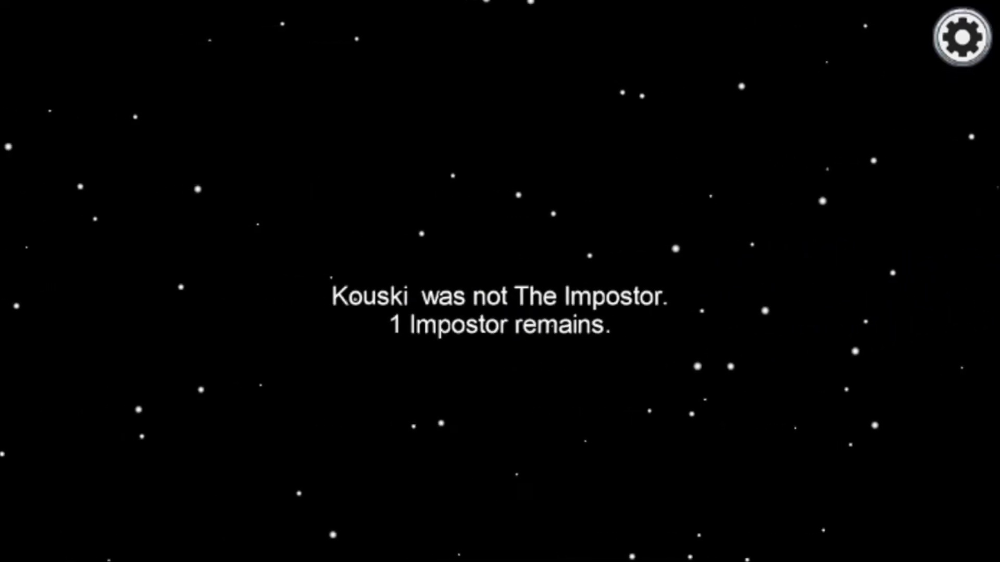

Processed frame saved to /content/runs/predict2/frame_14.jpg

image 1/1 /content/frames2/frame_3.jpg: 384x640 9 among us characterss, 4 dead bodys, 25.0ms
Speed: 4.6ms preprocess, 25.0ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)


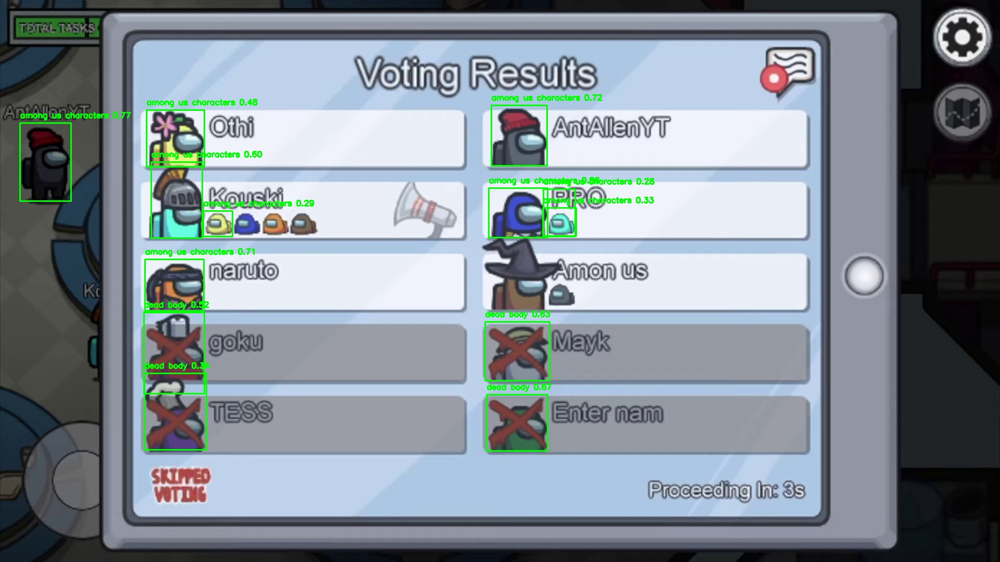

Processed frame saved to /content/runs/predict2/frame_3.jpg

image 1/1 /content/frames2/frame_6.jpg: 384x640 9 among us characterss, 4 dead bodys, 26.1ms
Speed: 4.4ms preprocess, 26.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


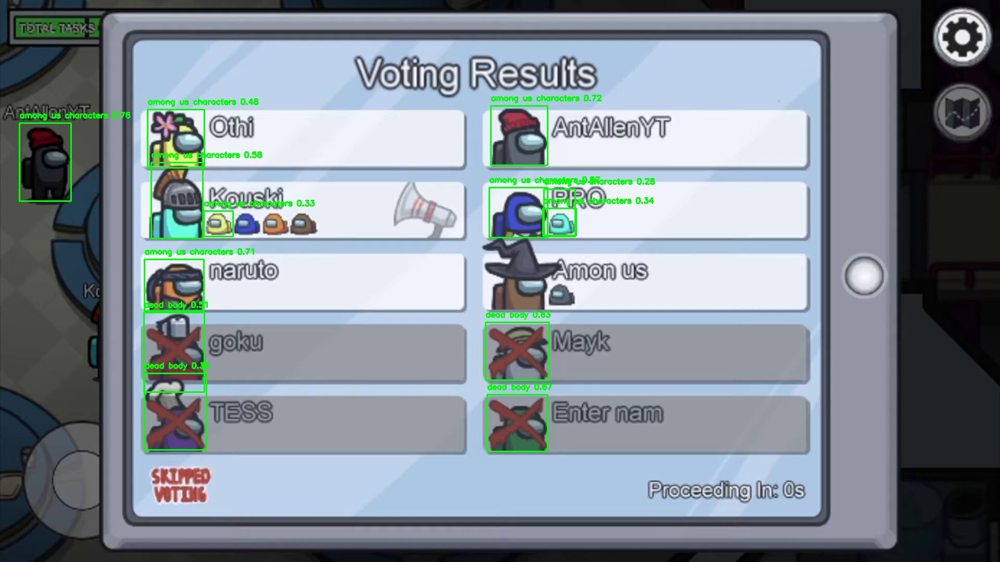

Processed frame saved to /content/runs/predict2/frame_6.jpg

image 1/1 /content/frames2/frame_30.jpg: 384x640 1 among us characters, 24.6ms
Speed: 6.8ms preprocess, 24.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


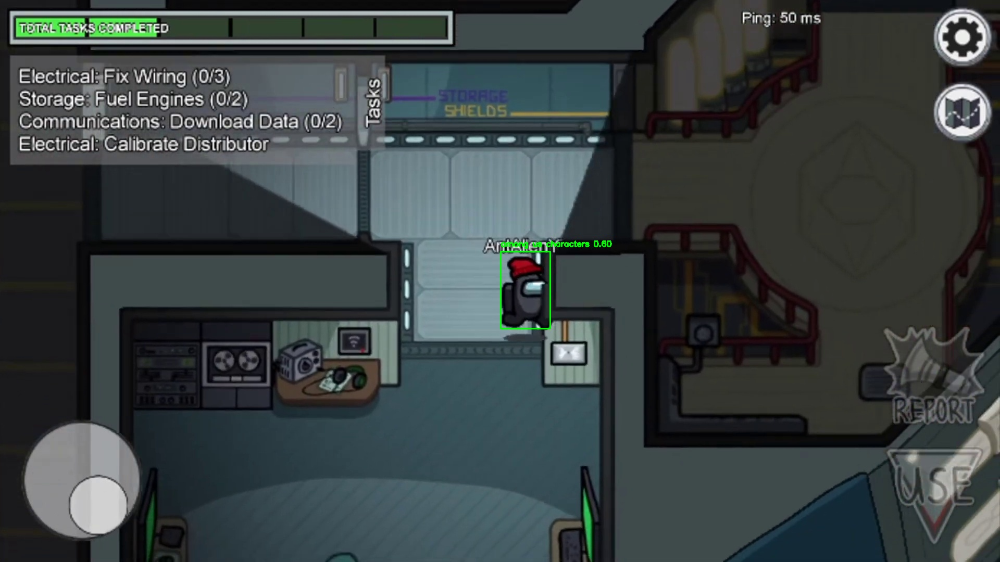

Processed frame saved to /content/runs/predict2/frame_30.jpg

image 1/1 /content/frames2/frame_24.jpg: 384x640 2 among us characterss, 1 vent, 24.7ms
Speed: 7.7ms preprocess, 24.7ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


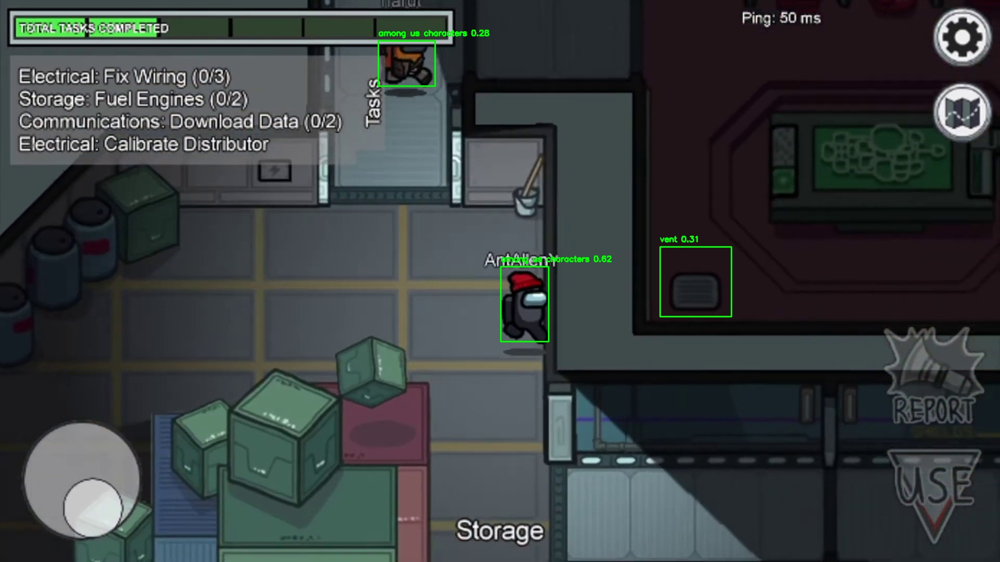

Processed frame saved to /content/runs/predict2/frame_24.jpg

image 1/1 /content/frames2/frame_2.jpg: 384x640 10 among us characterss, 4 dead bodys, 27.1ms
Speed: 3.2ms preprocess, 27.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


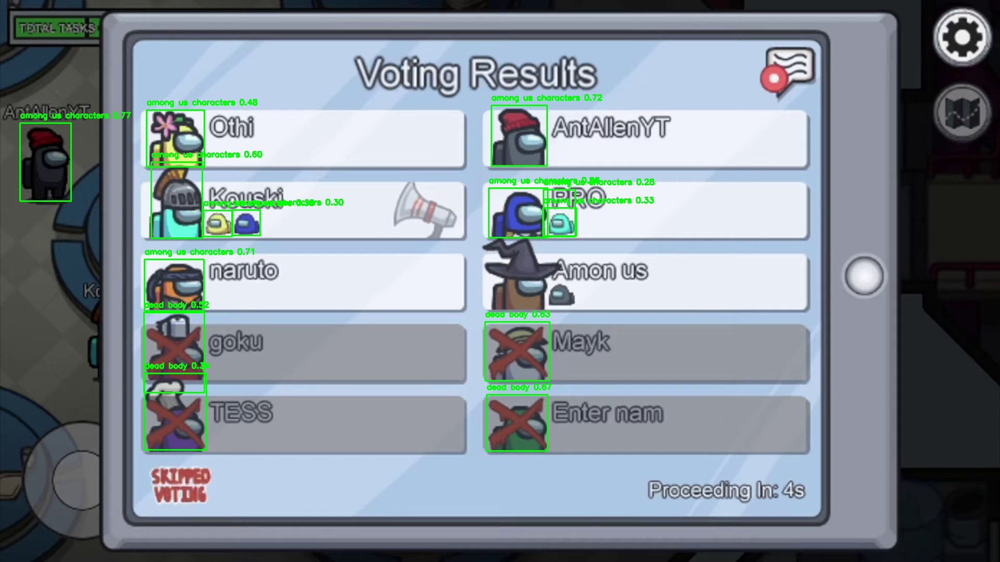

Processed frame saved to /content/runs/predict2/frame_2.jpg

image 1/1 /content/frames2/frame_13.jpg: 384x640 (no detections), 24.6ms
Speed: 3.1ms preprocess, 24.6ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


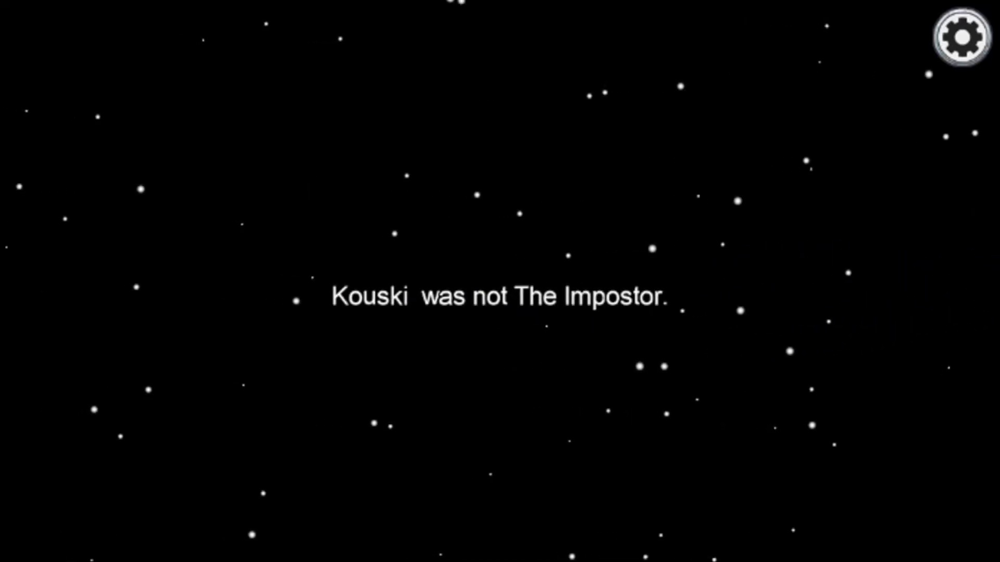

Processed frame saved to /content/runs/predict2/frame_13.jpg

image 1/1 /content/frames2/frame_21.jpg: 384x640 1 among us characters, 24.6ms
Speed: 3.1ms preprocess, 24.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


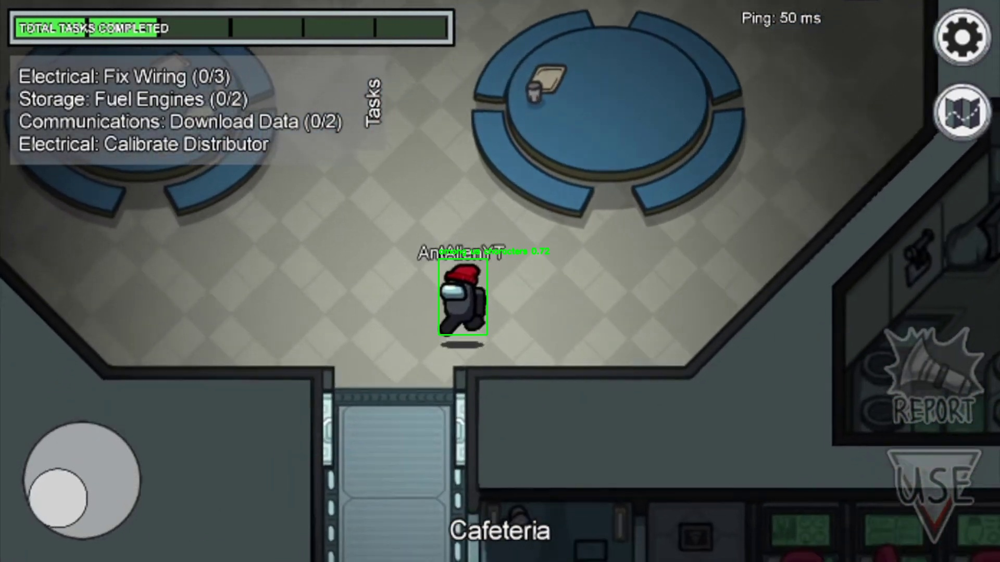

Processed frame saved to /content/runs/predict2/frame_21.jpg

image 1/1 /content/frames2/frame_9.jpg: 384x640 (no detections), 24.6ms
Speed: 3.2ms preprocess, 24.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


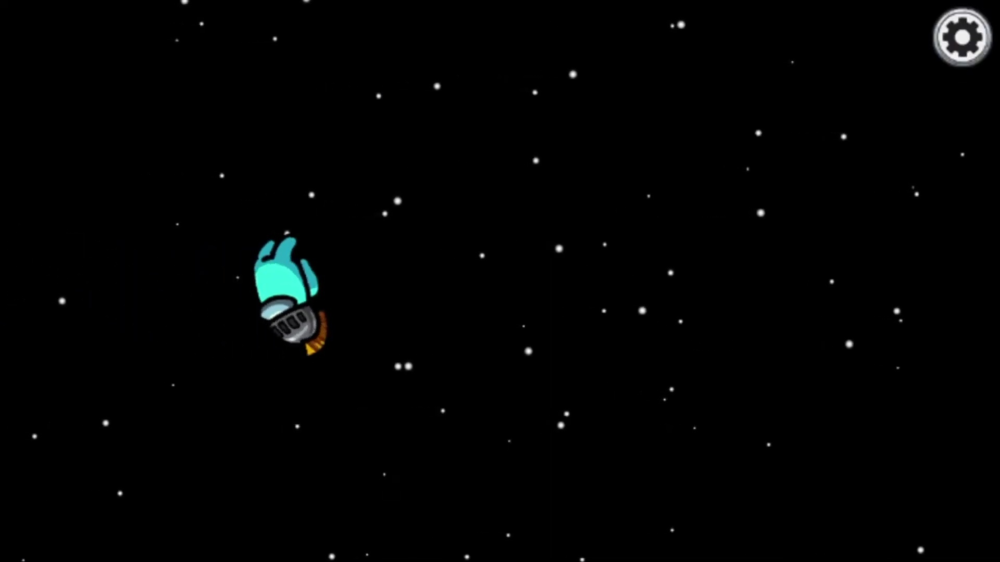

Processed frame saved to /content/runs/predict2/frame_9.jpg

image 1/1 /content/frames2/frame_25.jpg: 384x640 1 among us characters, 1 vent, 24.6ms
Speed: 3.1ms preprocess, 24.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


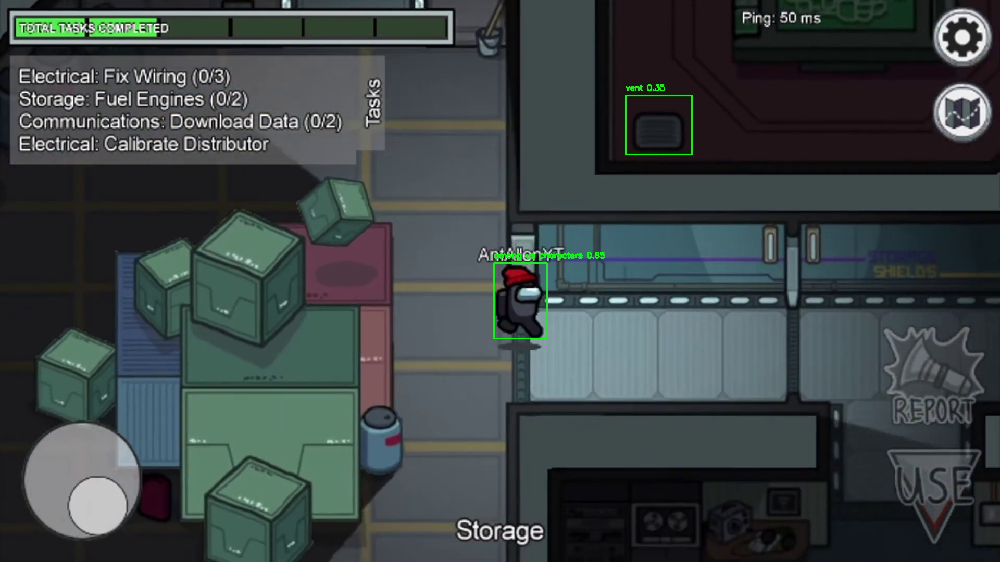

Processed frame saved to /content/runs/predict2/frame_25.jpg

image 1/1 /content/frames2/frame_5.jpg: 384x640 9 among us characterss, 4 dead bodys, 24.6ms
Speed: 3.3ms preprocess, 24.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


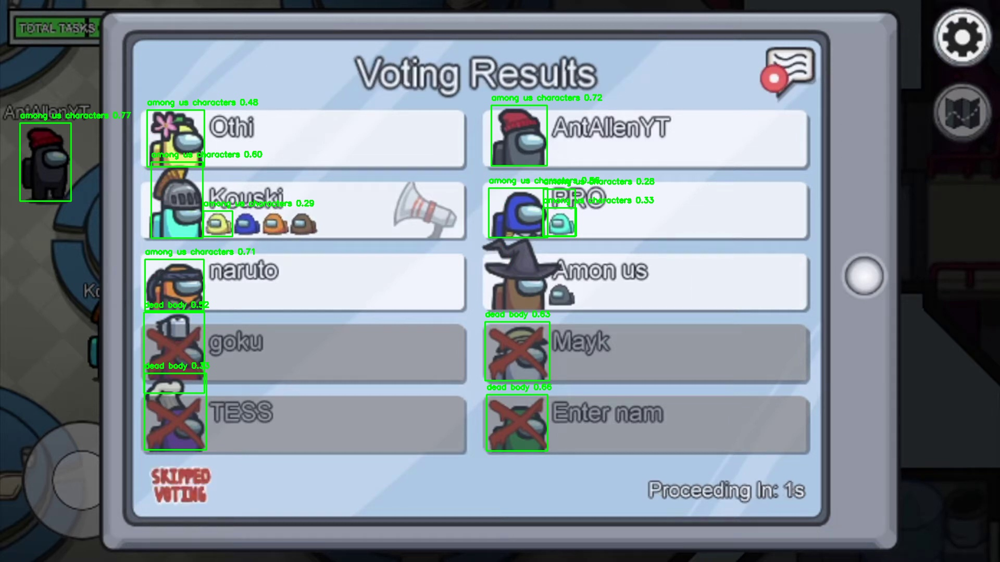

Processed frame saved to /content/runs/predict2/frame_5.jpg

image 1/1 /content/frames2/frame_20.jpg: 384x640 1 among us characters, 1 vent, 26.2ms
Speed: 6.3ms preprocess, 26.2ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)


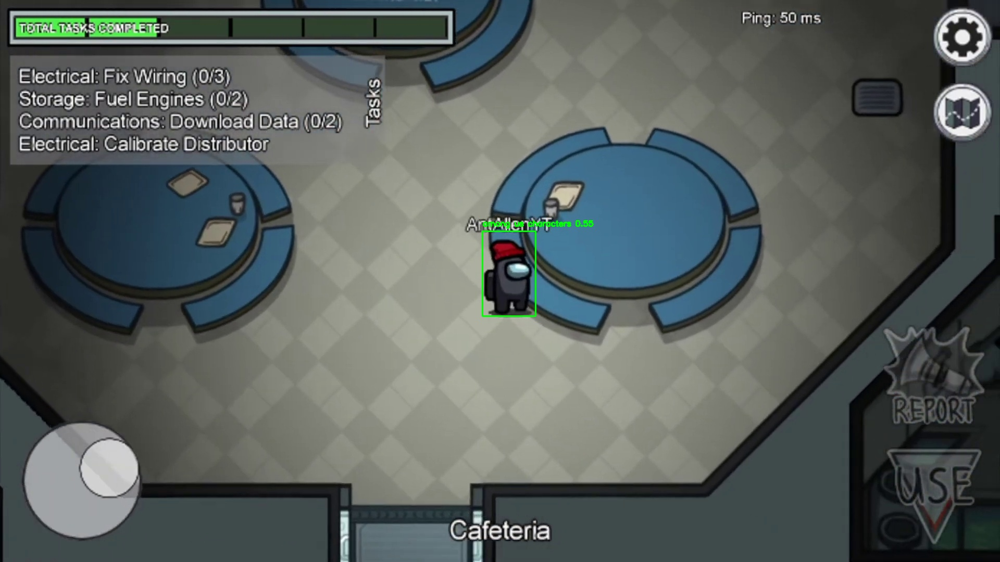

Processed frame saved to /content/runs/predict2/frame_20.jpg

image 1/1 /content/frames2/frame_28.jpg: 384x640 2 among us characterss, 1 vent, 24.7ms
Speed: 3.1ms preprocess, 24.7ms inference, 6.8ms postprocess per image at shape (1, 3, 384, 640)


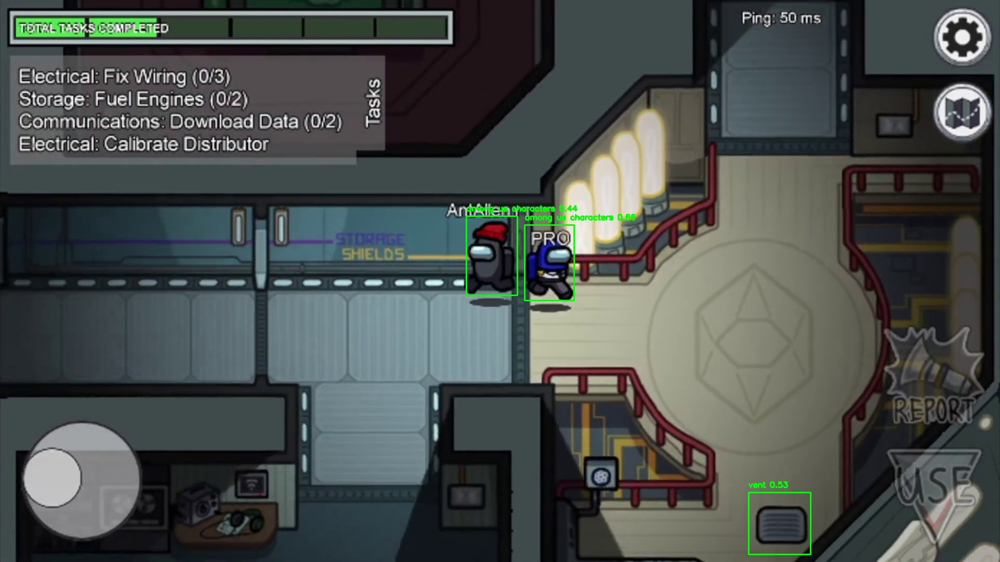

Processed frame saved to /content/runs/predict2/frame_28.jpg

image 1/1 /content/frames2/frame_17.jpg: 384x640 2 among us characterss, 24.6ms
Speed: 3.1ms preprocess, 24.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


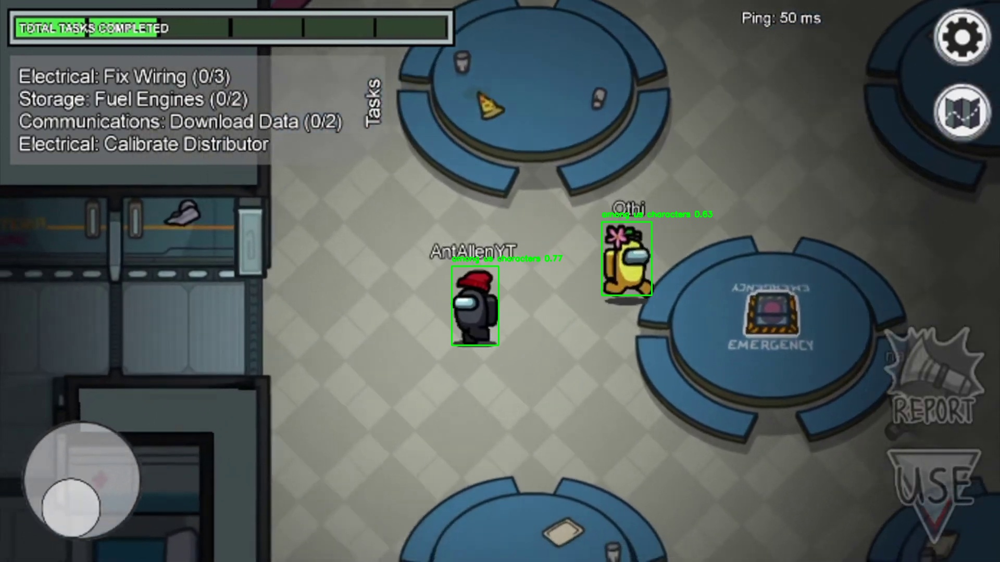

Processed frame saved to /content/runs/predict2/frame_17.jpg

image 1/1 /content/frames2/frame_22.jpg: 384x640 1 among us characters, 24.6ms
Speed: 3.0ms preprocess, 24.6ms inference, 4.3ms postprocess per image at shape (1, 3, 384, 640)


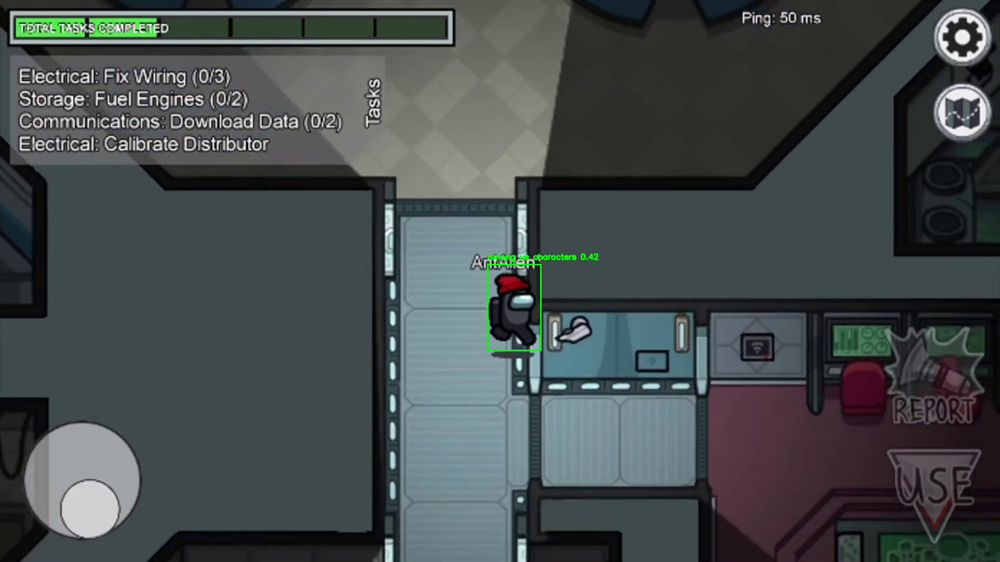

Processed frame saved to /content/runs/predict2/frame_22.jpg

image 1/1 /content/frames2/frame_16.jpg: 384x640 5 among us characterss, 27.7ms
Speed: 3.3ms preprocess, 27.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


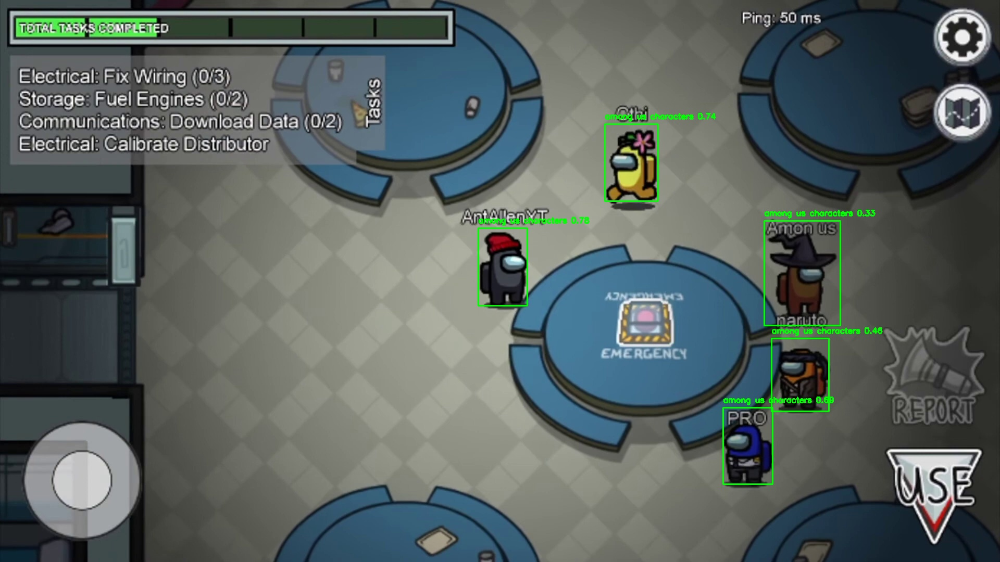

Processed frame saved to /content/runs/predict2/frame_16.jpg

image 1/1 /content/frames2/frame_26.jpg: 384x640 1 among us characters, 1 vent, 24.7ms
Speed: 8.3ms preprocess, 24.7ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)


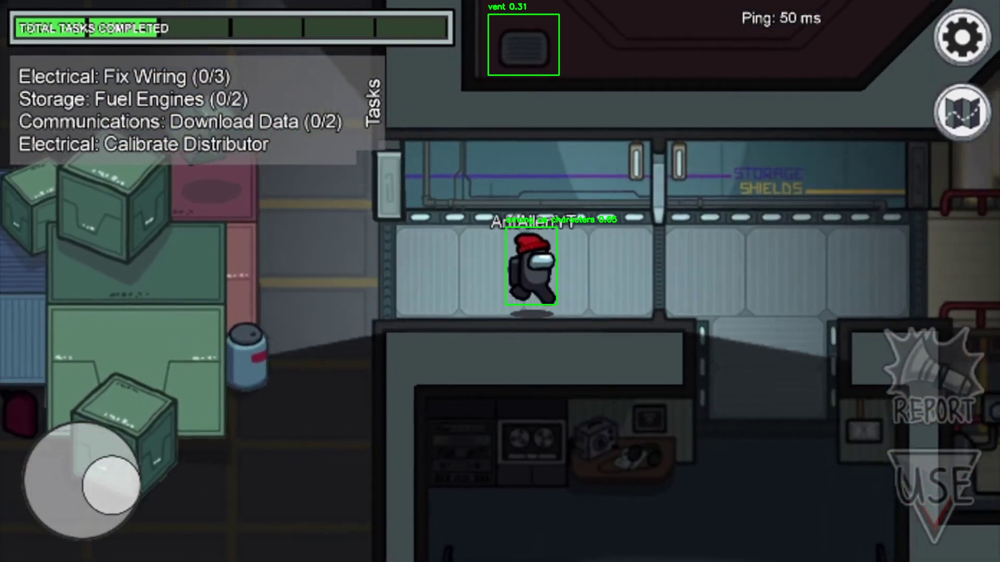

Processed frame saved to /content/runs/predict2/frame_26.jpg

image 1/1 /content/frames2/frame_4.jpg: 384x640 9 among us characterss, 4 dead bodys, 24.6ms
Speed: 7.3ms preprocess, 24.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


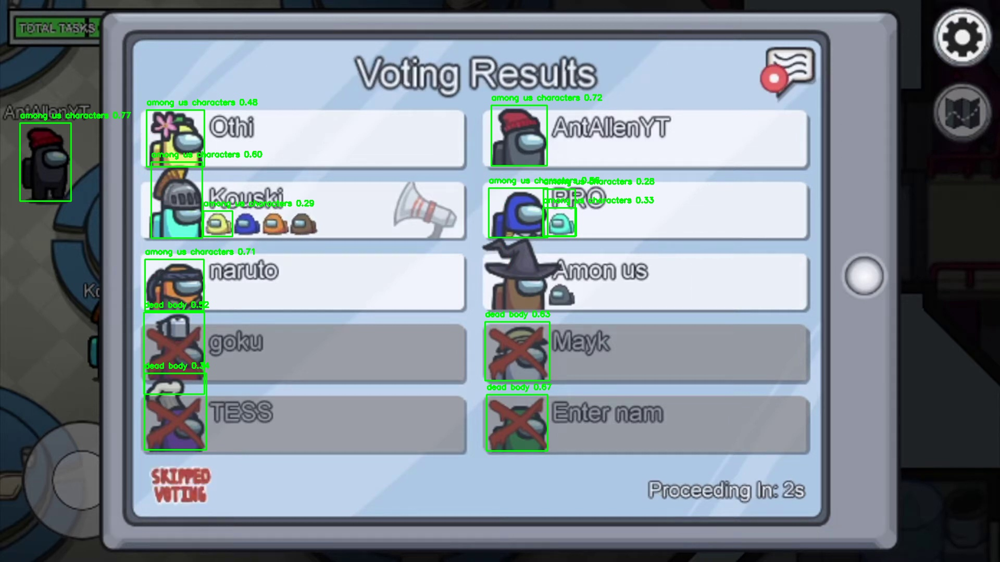

Processed frame saved to /content/runs/predict2/frame_4.jpg

image 1/1 /content/frames2/frame_0.jpg: 384x640 7 among us characterss, 4 dead bodys, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)


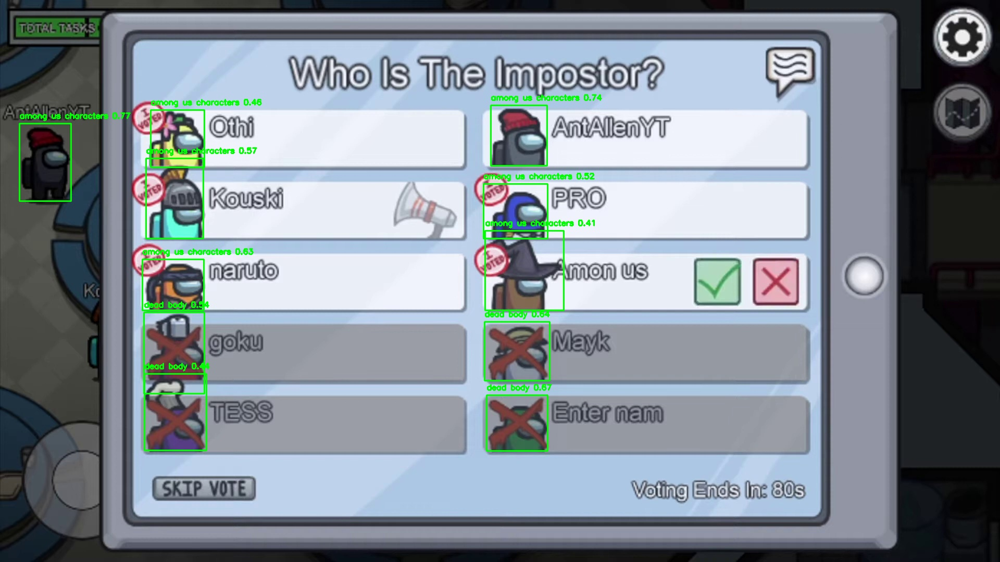

Processed frame saved to /content/runs/predict2/frame_0.jpg

image 1/1 /content/frames2/frame_10.jpg: 384x640 (no detections), 24.7ms
Speed: 3.4ms preprocess, 24.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


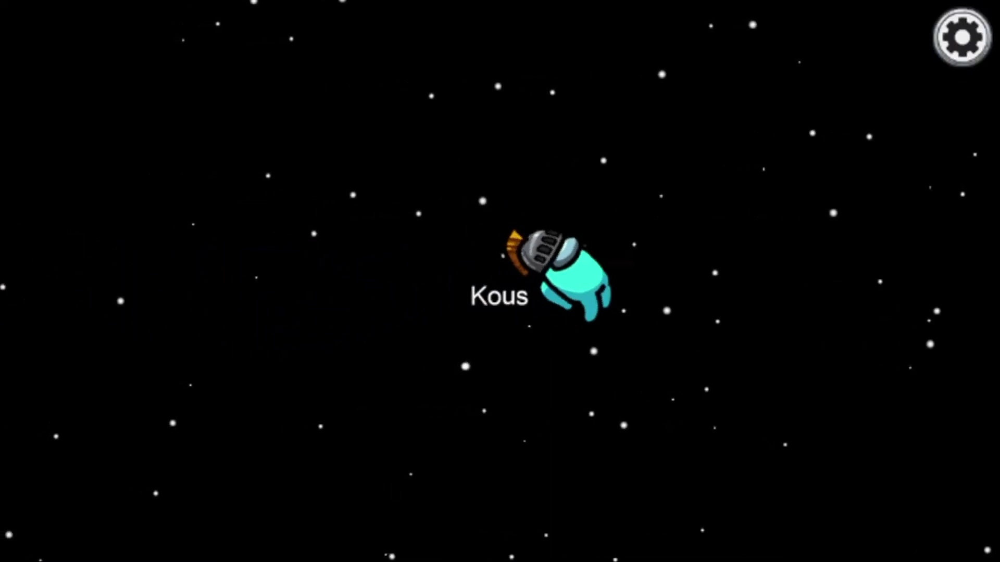

Processed frame saved to /content/runs/predict2/frame_10.jpg

image 1/1 /content/frames2/frame_31.jpg: 384x640 1 among us characters, 25.1ms
Speed: 3.2ms preprocess, 25.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


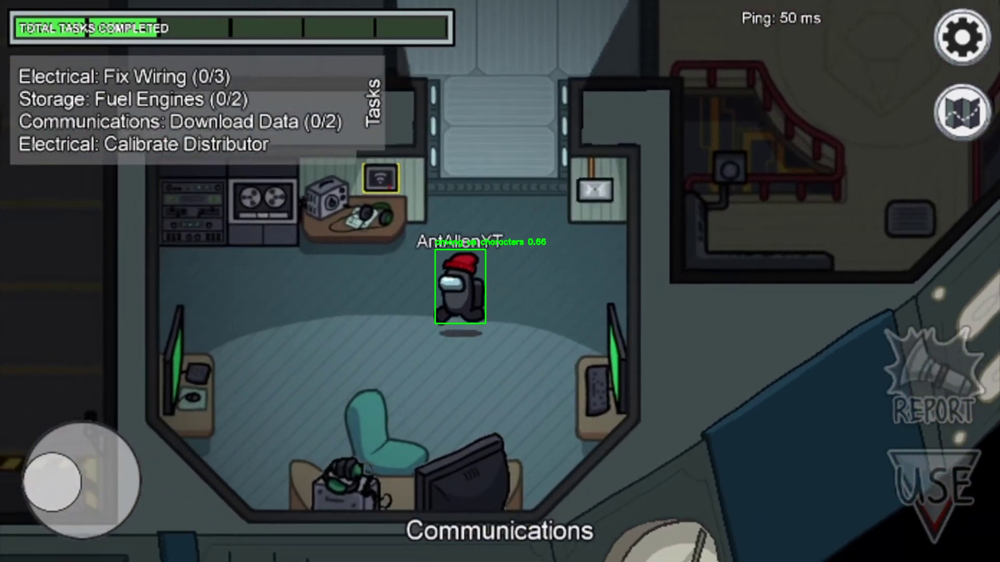

Processed frame saved to /content/runs/predict2/frame_31.jpg

image 1/1 /content/frames2/frame_7.jpg: 384x640 (no detections), 24.6ms
Speed: 7.1ms preprocess, 24.6ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


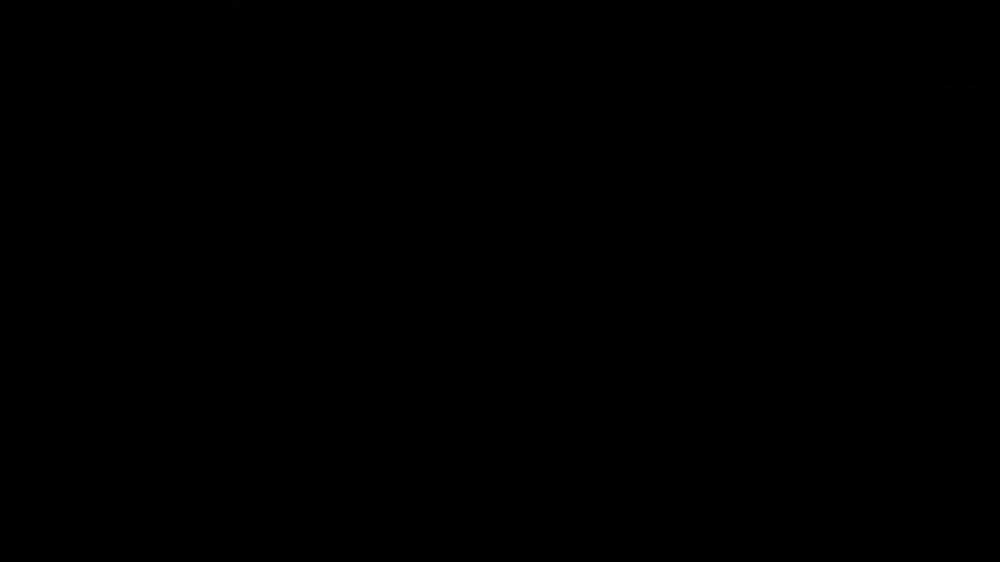

Processed frame saved to /content/runs/predict2/frame_7.jpg

image 1/1 /content/frames2/frame_23.jpg: 384x640 2 among us characterss, 1 vent, 24.7ms
Speed: 3.5ms preprocess, 24.7ms inference, 6.9ms postprocess per image at shape (1, 3, 384, 640)


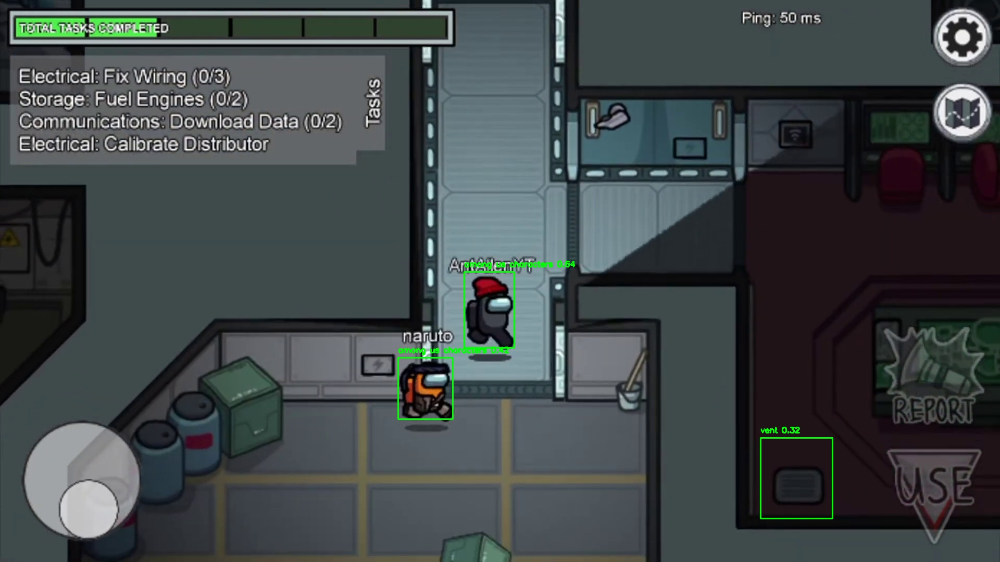

Processed frame saved to /content/runs/predict2/frame_23.jpg

image 1/1 /content/frames2/frame_18.jpg: 384x640 3 among us characterss, 24.7ms
Speed: 6.5ms preprocess, 24.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


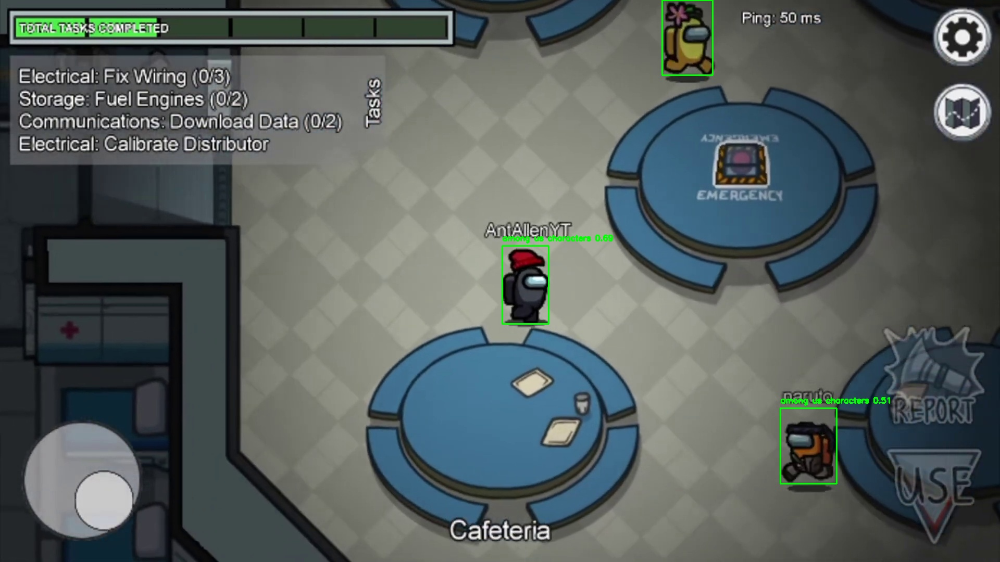

Processed frame saved to /content/runs/predict2/frame_18.jpg

image 1/1 /content/frames2/frame_19.jpg: 384x640 1 among us characters, 24.8ms
Speed: 3.2ms preprocess, 24.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


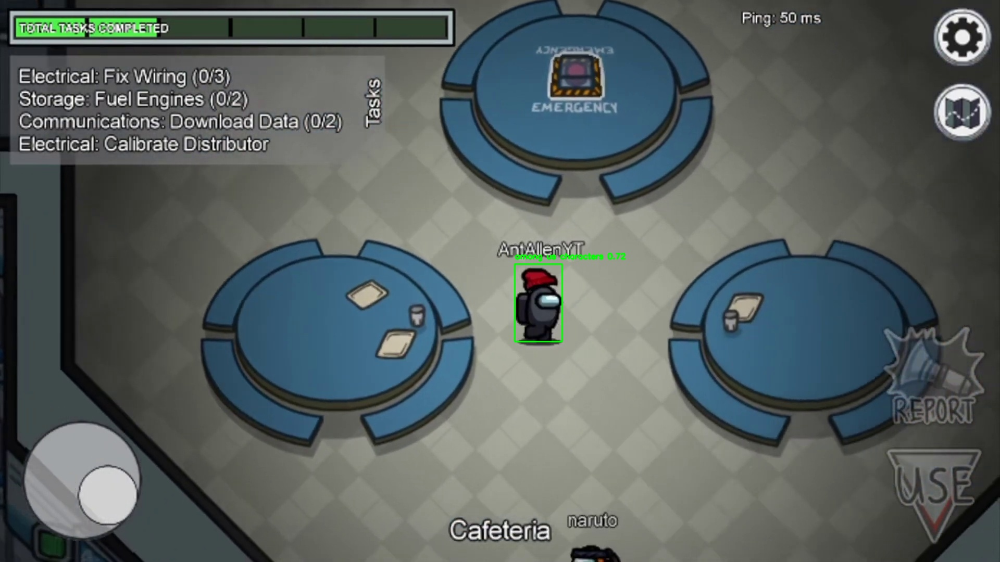

Processed frame saved to /content/runs/predict2/frame_19.jpg
Processing complete.


In [28]:
from ultralytics import YOLO
import cv2
import os
from IPython.display import Image, display

# Define the confidence threshold
confidence_threshold = 0.27

# Load the model
model = YOLO("/content/amongusdata1/yolov8_model.pt")

# Get class names from the model
class_names = model.names

# Directory paths
frames_dir = "/content/frames2/"
processed_frames_dir = "/content/runs/predict2/"
os.makedirs(processed_frames_dir, exist_ok=True)

# Process each frame
for frame_filename in os.listdir(frames_dir):
    frame_path = os.path.join(frames_dir, frame_filename)

    # Perform inference
    results = model(frame_path)

    # Extract the results for the first image in the batch
    result = results[0]

    # Filter out detections below the confidence threshold
    filtered_boxes = []
    for box in result.boxes:
        if box.conf >= confidence_threshold:
            filtered_boxes.append(box)
    result.boxes = filtered_boxes

    # Load the original image
    img = cv2.imread(frame_path)

    # Iterate over filtered detections
    for box in filtered_boxes:
        xmin, ymin, xmax, ymax = box.xyxy[0].cpu().numpy().astype(int)
        confidence = box.conf.item()
        class_id = int(box.cls.item())

        # Draw bounding box
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

        # Get the class name
        class_name = class_names[class_id]

        # Put label with class name and confidence
        label = f"{class_name} {confidence:.2f}"
        cv2.putText(img, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Save the processed image
    processed_frame_path = os.path.join(processed_frames_dir, frame_filename)
    cv2.imwrite(processed_frame_path, img)

    # Display the processed image
    display(Image(processed_frame_path))

    print(f"Processed frame saved to {processed_frame_path}")

print("Processing complete.")
